<a href="https://colab.research.google.com/github/Moghimkhan/Multi_Class-Calssification/blob/main/Multi_class_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#import zipfile
#!unzip -u '/content/drive/MyDrive/Dog-vision/dog-breed-identification.zip' -d "/content/drive/MyDrive/Dog-vision/"


#Multil-class Dog Breed Classification
It is multi-class image classifier using TensorFlow 2.x and TensorFlow Hub.

## 1. Problem
Identifying the breed of a dog given an image of a dog.

## 2. Data
It is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features
Brief overview of the data:

Given that our dataset comprises images (unstructured data), employing deep learning or transfer learning appears to be the most suitable approach.

The dataset consists of 120 distinct dog breeds, each representing a unique class.

The training set comprises over 10,000 labeled images, whereas the test set includes an equivalent number of unlabeled images for predictive analysis.

**Get Our workspace ready**

* Import TensorFlow 2.x
* Import TensorFlow Hub
* GPU is activated

In [ ]:
#  import tenserflow into colab
# import tensorflow as tf
# print('Tf vesion:',tf.__version__)

In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)


# Check for GPU availability
print("GPU", "available (YESSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")


TF version: 2.15.0
TF Hub version: 0.16.0
GPU available (YESSSS!!!!!)


## Getting our data ready (turning into Tensors)
In the realm of machine learning models, it is imperative that our data is in numerical format. Therefore, our initial step involves converting our images into Tensors, which are numerical representations.

To commence this process, we'll begin by accessing our data and examining the associated labels.

In [ ]:
# Checkout the labels of our data

import pandas as pd
label_csv = pd.read_csv("/content/drive/MyDrive/Dog-vision/labels.csv")
print(label_csv.describe())
print(label_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
label_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

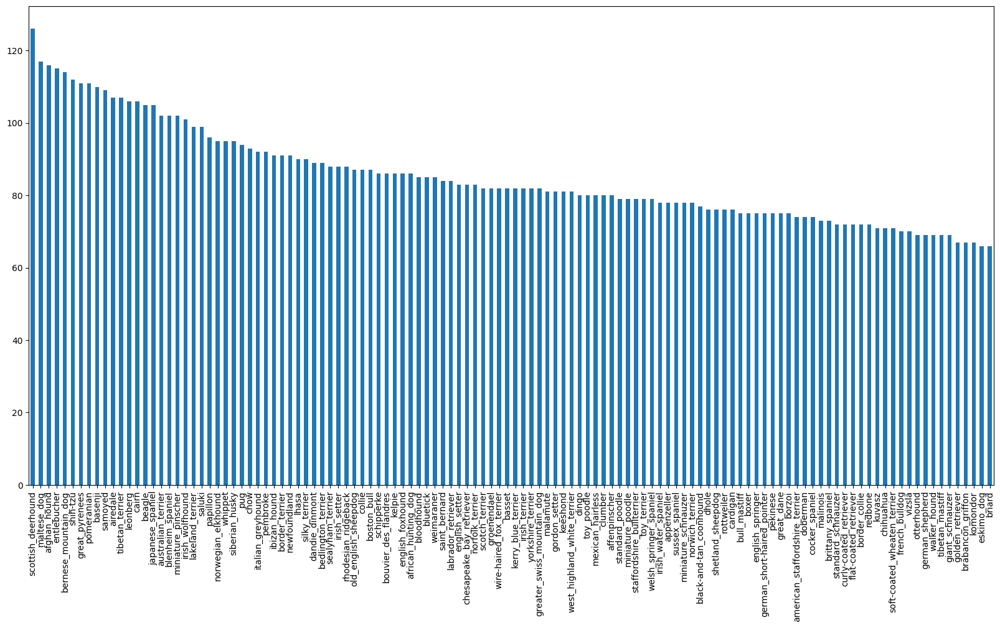

In [ ]:
# How many images are there of each breed?
label_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
# What's the median number of images per class?
label_csv["breed"].value_counts().median()

82.0

In [ ]:
#  Google: minimum labale image per each class:at least 10
# Howmany images are there of each bread?

label_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

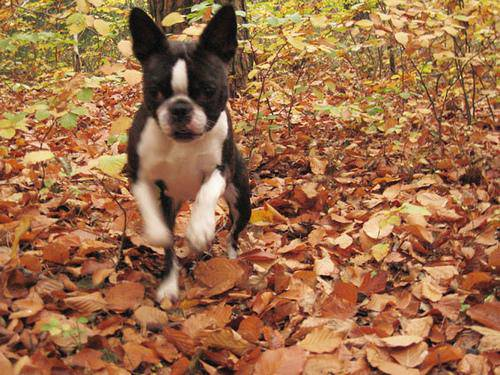

In [ ]:
#  Lets view an image
from IPython.display import Image
Image ('/content/drive/MyDrive/Dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg')

### Obtaining Images and Labels
As we possess the image IDs and their corresponding labels within a DataFrame (labels_csv), we'll leverage this information to establish:

A list of filepaths to training images
An array containing all labels
An array comprising all unique labels
Our initial focus will be on generating a list of filepaths to images without importing them immediately. This approach is preferred, as working with filepaths (strings) proves to be more efficient than directly handling images.

In [ ]:
label_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Get a list of all of our image file pathnames.
# Create pathnames from image Id's
filenames = ['/content/drive/MyDrive/Dog-vision/train/' + fname +'.jpg' for fname in label_csv['id']]

#  check the first 10
filenames[:10]

['/content/drive/MyDrive/Dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
os.listdir('/content/drive/MyDrive/Dog-vision/train/')

['e95bd9ab625ad1c16b513a13a27c447d.jpg',
 'dedbc436c840a97feb7b2f3fa1175fa5.jpg',
 'e466e0a3b43403c7bffd943fffc92ced.jpg',
 'e03cdc6533bf441f8bdb7467b1039996.jpg',
 'e79011daac807552f798aa1effb60ee4.jpg',
 'e36c116cdff32db5d5b87b3c789ce46c.jpg',
 'e06773bd0666b3b9597b93a54e302c55.jpg',
 'dbe9a2868d227a12197fb6c44b93d85a.jpg',
 'e552addd2461f8a62e9691fa26b21370.jpg',
 'dc99929daa2c14970c44afaf16ff502f.jpg',
 'e30db8f52d5fe88e128697d8fbd163e9.jpg',
 'e4f17a9e5ee1ed5385744cd6e8916a4e.jpg',
 'e8a902080c150632c8b45b8013d0e540.jpg',
 'e36cf92886e752cdd8be2101b3090a2c.jpg',
 'e640b0064c429c2cbad0788219b57303.jpg',
 'e270622b5ffec8294d7e7628c4ff6c1e.jpg',
 'e0fe902cde4c16de2dd1bd8c5b6dc08e.jpg',
 'e438c6b845a8498620dc14f2f25bf603.jpg',
 'e59ba8576716c823f7731385d802fd49.jpg',
 'e267360efadbd9da278fde791fc03f20.jpg',
 'e75f2316c5dd47b87a22bbe95cf8b8da.jpg',
 'e917bb5669e0c273eb16304af1f69e1d.jpg',
 'dca86fc4e9461bb4fc110bf1e13274ed.jpg',
 'de1f5f90eed51d8229d197a91d35f4d4.jpg',
 'dc144b931fbfbd

In [ ]:
# Check whether number of filenames match number of actual files
import os
if len(os.listdir('/content/drive/MyDrive/Dog-vision/train/'))==len(filenames):
  print('it match!!!')
else:
  print('not match check the target')

it match!!!


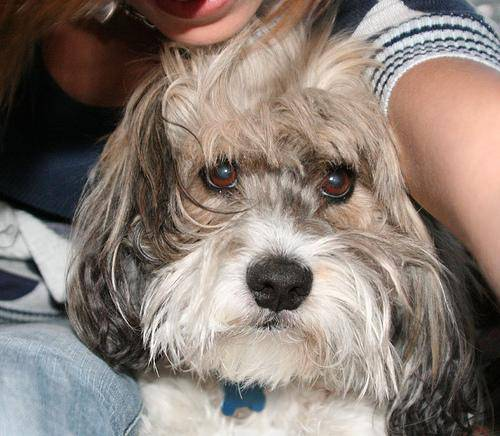

In [ ]:
#  One more chexk
Image(filenames[900])

In [ ]:
label_csv['breed'][900]

'lhasa'

Woah! What a beast!

Now we've got our image filepaths together, let's get the labels.

We'll take them from labels_csv and turn them into a `NumPy array`.

In [ ]:
# first way
labels = label_csv['breed']
labels

0                     boston_bull
1                           dingo
2                        pekinese
3                        bluetick
4                golden_retriever
                   ...           
10217                      borzoi
10218              dandie_dinmont
10219                    airedale
10220          miniature_pinscher
10221    chesapeake_bay_retriever
Name: breed, Length: 10222, dtype: object

In [ ]:
# second way
import numpy as np
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# third way
labels = label_csv['breed'].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# See if number of labels matches the number of filenames
if len(labels)== len(filenames):
  print('Number of labels matches num of fienames!!!!')
else:
  print("check data directories")

Number of labels matches num of fienames!!!!



Verification of Successful Processing
Upon successful execution, we anticipate an equal number of images and labels in our dataset.

However, it's essential to note that machine learning models cannot process 'strings' as input, which is the current format of our labels. Consequently, we need to transform our labels into numerical representations.

Our initial step involves identifying all unique dog breed names. Subsequently, we'll iterate through the list of labels, comparing them to the unique breeds, and generate a boolean list. This list will indicate the actual label (True) and the non-matching ones (False).

In [ ]:
# find a uniqu label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
# Turn a single label into an arrey of boolean
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
unique_breeds[19]

'boston_bull'

In [ ]:
# turn every label into boolean array
boolean_labels= [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels),len(labels)

(10222, 10222)

In [ ]:
# example: turning boolean arrays into integers
print(labels[0]) #original label
print(np.where(unique_breeds==labels[0])) # index where label accurs
print(boolean_labels[0].argmax()) # index where labelaccures in boolean array
print(boolean_labels[0].astype(int)) #there will be a 1 where the sample label accurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['/content/drive/MyDrive/Dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

Wonderful! Now we've got our labels in a numeric format and our image filepaths easily accessible (they aren't numeric yet), let's split our data up.

### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set (a split of the data we can test our model on before making final predicitons on the test set), let's make one.

We could use `Scikit-Learn's train_test_split` function or we could simply make manual splits of the data.

For accessibility later, let's save our filenames variable to `X` (data) and our labels to `y`.

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [ ]:
len(filenames),len(boolean_labels)

(10222, 10222)

Since we're working with 10,000+ images, it's a good idea to work with a portion of them to make sure things are working before training on them all.

This is because computing with 10,000+ images could take a fairly long time. And our goal when working through machine learning projects is to reduce the time between experiments.

Let's start experimenting with 1000 and increase it as we need.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 # @param {type:"slider", min:1000, max:10000, step:1000}
NUM_IMAGES

1000


Now let's split our data into training and validation sets. We'll use and 80/20 split (80% training data, 20% validation data).

In [ ]:
# Import train_test_split from Scikit-Learn
from sklearn.model_selection import train_test_split

# Split them into training and validation using NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Check out the training data (image file paths and labels)
X_train[:5], y_train[:2]

(['/content/drive/MyDrive/Dog-vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog-vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Dog-vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Dog-vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Dog-vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fals

### Image Preprocessing (turning images into Tensors)
While our labels are in numeric format, our images are currently represented as file paths.

In the context of TensorFlow, our data must be in Tensor form. A Tensor serves as a numerical representation, akin to a combination of NumPy arrays. Notably, Tensors possess the unique capability of being utilized on a GPU, aligning with how TensorFlow stores information and thereby facilitating faster numerical computing, especially for machine learning and deep learning models.

To preprocess our images into Tensors we're going to write a function which does a few things:

* Takes an image filename as input.
* Uses TensorFlow to read the file and save it to a variable, `image`.
* Turn our `image` (a jpeg file) into Tensors.
* Resize the `image` to be of shape (224, 224).
* Return the modified `image`.


For a deeper understanding of such functions, the TensorFlow documentation on loading images is a valuable resource: https://www.tensorflow.org/tutorials/load_data/images

The dimensions (224, 224) – this corresponds to the height and width of the input our model (which we'll explore shortly) expects. The '3' signifies the number of color channels per pixel – red, green, and blue.



In [ ]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
# Turn image into the tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

The only diff is that `tf.constant(image)[:2]` is in tensor and work with `gpu` that is faster. `image[:2]` is numpy array and uses `cpu`

## Now we've seen what an image looks like as a tensor, let's make a function to prepocess them.
1. Takes an `image` filename as input.
2. Uses TensorFlow to read the file and save it to a variable, `image`.
3. Turn our `image` (a jpeg file) into Tensors.
4. Normalized our `image` (cinvert colour channel value from 0-225 to 0-1
5. Resize the `image` to be of shape (224, 224).
6. Return the modified `image`.

In [ ]:
# Define image size
IMG_SIZE = 224

# create function for preprocessing images
def process_image(image_path,img_size= IMG_SIZE):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read in image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-225 values to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

In [ ]:
#  check the above function line by line
# tensor = tf.io.read_file(filenames[26])
# tensor


In [ ]:
# tensor = tf.image.decode_jpeg(tensor, channels=3)
# tensor

In [ ]:
# tf.image.convert_image_dtype(tensor,tf.float32)

### Generating Data Batches

Now that we have a function to convert our images into Tensors, let's proceed to develop one that transforms our data into batches, specifically a TensorFlow BatchDataset.

But what exactly is a batch?

A batch, often referred to as a mini-batch, is a small subset of your data, typically containing a set number of images and their corresponding labels (commonly 32, which is the default batch size). In deep learning, rather than identifying patterns across the entire dataset simultaneously, it's common to analyze data one batch at a time.

Consider a scenario with 10,000+ images (which we are dealing with). Attempting to process them all at once could exceed the available memory on your GPU, resulting in an error. To circumvent this, it proves more efficient to create smaller batches of data and perform computations on one batch at a time.

TensorFlow excels when working with batches of `(image, label)` Tensors. Consequently, we'll construct a function to create these batches, taking advantage of the `process_image` function in the process.

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# demo of the above function
process_image(X[42],tf.constant(y[42]))

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

Now we'll proceed to create a function for generating data batches.

Considering that we'll be working with three different sets of data (training, validation, and test), it's essential to ensure that the function can accommodate each of these sets. We'll establish a default batch size of 32, aligning with the recommendation of Yann Lecun, a pioneer in deep learning, who suggests avoiding batch sizes exceeding 32.

Having established a means to convert our data into tuples of Tensors in the form `(image, label)`, the next step involves creating a function to organize all of our data `(X & y)` into batches efficiently!




In [ ]:
# Define the batches size,32 is a good start
BATCH_SIZE =32

# Create a function to turn data into batches

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
len(y[0])

120

### Visualizing Data Batches
Our data is now in batches, let's visualize them!

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
y[0].argmax()

19

In [ ]:
unique_breeds[y[0].argmax()]

'boston_bull'

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images,train_labels = next(train_data.as_numpy_iterator())
train_images,train_labels

(array([[[[0.28235295, 0.30588236, 0.25882354],
          [0.32240897, 0.34593838, 0.29887956],
          [0.35912117, 0.38265058, 0.33870798],
          ...,
          [0.0610287 , 0.15197743, 0.19360939],
          [0.03779758, 0.11981776, 0.17221627],
          [0.03529412, 0.10980393, 0.16470589]],
 
         [[0.32587537, 0.34940478, 0.30234596],
          [0.3469875 , 0.3705169 , 0.32345808],
          [0.36196494, 0.38549438, 0.33997974],
          ...,
          [0.04449625, 0.12910381, 0.16637287],
          [0.03312561, 0.10937878, 0.1565578 ],
          [0.02935925, 0.10189077, 0.15283614]],
 
         [[0.38364848, 0.40581235, 0.35738796],
          [0.37961382, 0.4017777 , 0.35335332],
          [0.36601117, 0.38817507, 0.33975068],
          ...,
          [0.03082889, 0.10579363, 0.13741149],
          [0.02810046, 0.09527484, 0.1354674 ],
          [0.02352941, 0.09070379, 0.13503152]],
 
         ...,
 
         [[0.7026436 , 0.7026436 , 0.60852593],
          [0.71472

In [ ]:
len(train_images),len(train_labels)

(32, 32)

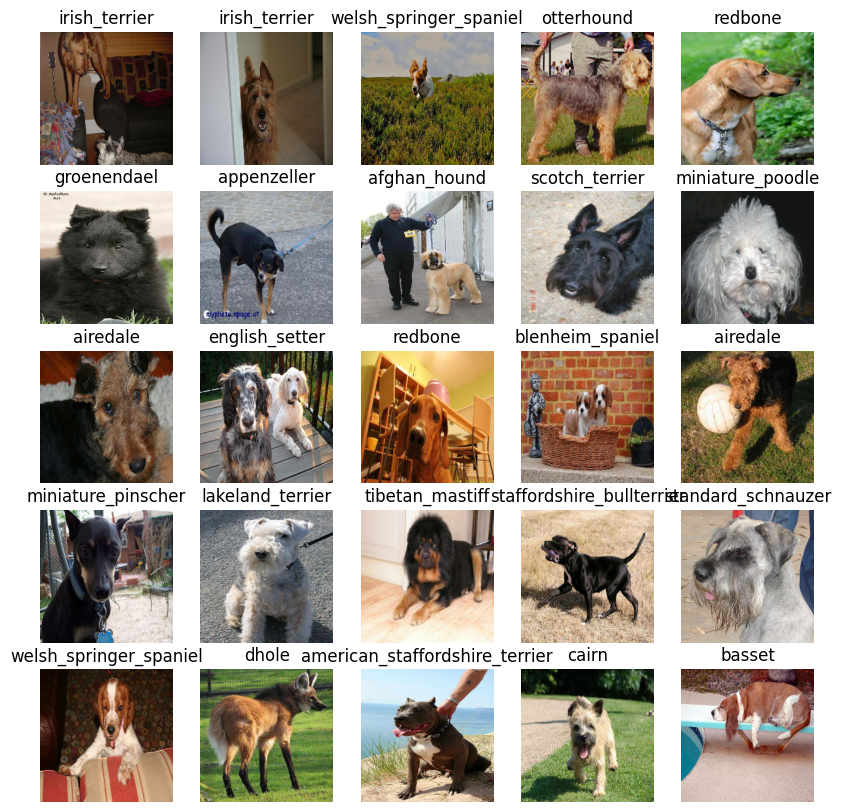

In [ ]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

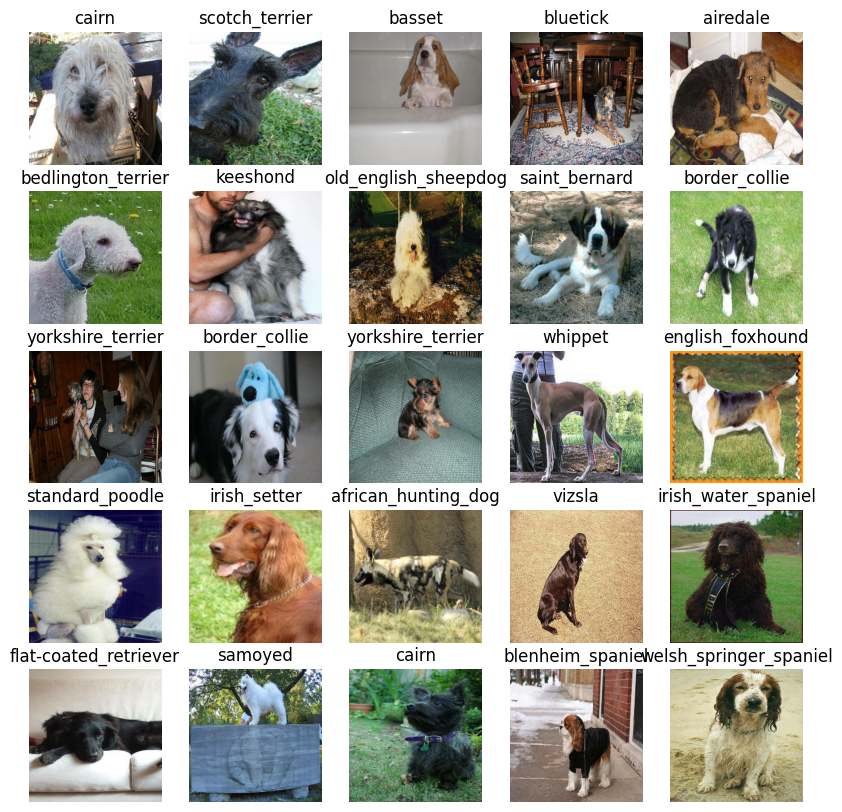

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

### Building a model
Before we build a model, there are a few things we need to define:

* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [ ]:
IMG_SIZE

224

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [ ]:
len(unique_breeds)

120

pytorch, modelzoo,*paperswithcode*

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:

* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.
* All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

## TensorBoard Callback
To setup a TensorBoard callback:

* Load the TensorBoard notebook extension
* Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function.
* Visualize our models training logs with the %tensorboard magic function (we'll do this after model training).
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
# to access date and time:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Dog-vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early Stopping Callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

### Training a model (on subset of data)
Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YESSS!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSS!!!!!!)


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 437s 17s/step - loss: 4.5717 - accuracy: 0.1125 - val_loss: 3.4353 - val_accuracy: 0.2600
Epoch 2/100
25/25 [==============================] - 3s 108ms/step - loss: 1.6566 - accuracy: 0.6625 - val_loss: 2.2309 - val_accuracy: 0.4850
Epoch 3/100
25/25 [==============================] - 4s 174ms/step - loss: 0.5700 - accuracy: 0.9400 - val_loss: 1.7180 - val_accuracy: 0.5500
Epoch 4/100
25/25 [==============================] - 3s 107ms/step - loss: 0.2519 - accuracy: 0.9887 - val_loss: 1.5461 - val_accuracy: 0.5850
Epoch 5/100
25/25 [==============================] - 3s 112ms/step - loss: 0.1460 - accuracy: 0.9987 - val_loss: 1.4472 - val_accuracy: 0.6200
Epoch 6/100
25/25 [==============================] - 4s 146ms/step - loss: 0.0991 - accuracy: 0.9987 - val_loss: 1.4043 - val_accuracy: 0.6100
Epoch 7/100
25/25 [==============================

**Question**: It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?
        
Note: Overfitting to begin with is a good thing! It means our model is learning!!!

```
# This is formatted as code
```



### Checking the TensorBoard logs
* The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog-vision/logs

<IPython.core.display.Javascript object>

### Making and evaluating predictions using a trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 22s 2s/step


array([[0.02821822, 0.00689723, 0.00619732, ..., 0.00402708, 0.00085769,
        0.00084221],
       [0.03455551, 0.00517324, 0.00329126, ..., 0.05230466, 0.03059006,
        0.00079521],
       [0.00065283, 0.02497784, 0.00082417, ..., 0.0024279 , 0.00220799,
        0.0302704 ],
       ...,
       [0.0011685 , 0.00125085, 0.00840209, ..., 0.00054751, 0.00073601,
        0.00109212],
       [0.00929247, 0.00134109, 0.00857576, ..., 0.00217148, 0.00720178,
        0.01169771],
       [0.00297479, 0.02823155, 0.02765185, ..., 0.00111971, 0.00036652,
        0.00244153]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
len(predictions[0])

120

In [ ]:
predictions[0]

array([1.14646379e-03, 6.81621623e-06, 1.86528498e-03, 1.25974766e-05,
       1.70300962e-04, 1.85527988e-05, 1.18168090e-02, 3.11449840e-04,
       7.98984111e-05, 3.13771801e-04, 1.34595539e-04, 2.60104018e-04,
       2.76661624e-04, 6.51984999e-04, 1.12246686e-04, 1.19444844e-03,
       8.77514030e-05, 3.62505257e-01, 1.06402777e-05, 8.99397783e-05,
       6.00736181e-04, 1.05342464e-04, 3.85492713e-05, 3.36249388e-04,
       3.46432294e-04, 1.04474355e-04, 2.13952869e-01, 1.13280930e-05,
       5.03273295e-05, 1.27454070e-04, 4.61577692e-05, 3.98512289e-04,
       3.91742069e-04, 1.21714875e-04, 2.57192969e-05, 2.96639539e-02,
       5.62615714e-05, 7.40105053e-04, 7.12233086e-05, 2.92732439e-04,
       6.60096761e-04, 2.52920327e-05, 6.56367629e-05, 8.08420082e-05,
       8.84023830e-05, 2.19044479e-04, 7.33374782e-06, 7.44797653e-05,
       1.70424100e-04, 1.87617290e-04, 1.36364892e-04, 1.59745861e-04,
       5.47665986e-04, 2.37332606e-05, 1.59527248e-04, 1.24496146e-04,
      

In [ ]:
np.sum(predictions[0]),np.sum(predictions[1])
#  It is because of `softmax` activation

(0.99999994, 1.0000001)

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.0158257e-03 1.1208167e-01 3.2438834e-03 1.7709617e-02 1.6344141e-03
 2.6428276e-03 4.3960428e-03 6.7331555e-04 5.2167720e-04 1.4560963e-02
 1.2720166e-03 3.5017889e-04 4.1693631e-03 3.0774478e-04 2.1301233e-03
 4.2285877e-03 4.1458681e-03 3.3769764e-03 2.9392412e-03 2.6043425e-03
 8.7142549e-03 1.8234068e-03 2.7710930e-04 6.0634213e-03 7.2173933e-03
 4.4237478e-03 2.5351046e-02 1.0886227e-03 1.8883250e-03 3.7085279e-04
 4.2359941e-03 8.6929752e-03 6.3774963e-03 2.3295328e-02 5.8816606e-03
 1.0378288e-02 2.5558993e-02 2.9231475e-03 1.6519249e-03 1.3826597e-02
 4.9964492e-03 7.2430111e-02 4.0719560e-03 8.9902413e-04 6.5922220e-03
 1.5824055e-02 2.1356763e-03 6.0882489e-03 3.7315760e-03 6.1238287e-03
 9.5111402e-03 3.9949524e-03 2.6188453e-03 3.8102493e-04 4.1564433e-03
 2.0882476e-03 1.4841385e-03 1.3471261e-02 2.3856452e-03 9.2027541e-03
 2.9084226e-02 4.0492443e-03 1.2633134e-02 1.5919071e-02 9.4008083e-03
 1.3604591e-02 1.7698724e-02 8.3243812e-04 3.0235984e-04 2.2485387e-02
 1.784

In [ ]:
unique_breeds[113]

'walker_hound'

In [ ]:
 np.argmax(predictions[0])

17

It would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'ibizan_hound'


Now, considering that our validation data is currently in a batch dataset, our next step involves "unbatchifying" it. This process is necessary to enable predictions on the validation images, allowing for a subsequent comparison of these predictions with the validation labels (truth labels).

In [ ]:
val_data
#  we have to set batch data tio unbatch labels

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
get_pred_label(labels[0])

'affenpinscher'

In [ ]:
get_pred_label(predictions[0])

'border_terrier'

Now we've got ways to get:

* Prediction labels
* Validation labels (truth labels)
* Validation images


Let's make some function to make these all a bit more visaulize.

We'll create a function which:

* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

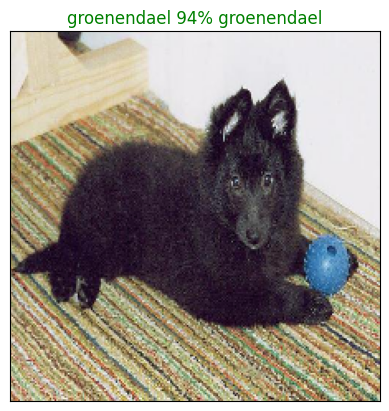

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using get_pred_label()
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes in descending order
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

In [ ]:
predictions[0].argsort()
# It givings us order of indexes that will sort this array.
# highest value is 1
# predictions[0].argsort()[-10:] because we need top ten

array([  1,  46,  18, 118,  27,   3,  92, 115,   5,  53,  41,  34,  75,
        63,  61,  69,  22,  30,  28,  71,  94,  36,  42,  84,  66,  38,
       101,  47,   8,  43,  16,  44,  19,  25,  21,  86, 112,  14, 113,
       107,  33,  55,  29,  82,  10,  50,  54,  51,   4,  48,  91,  49,
        99, 111,  67,  45,  95,  58,  11, 108,  12,  39,   7,   9,  23,
        24,  72,  93, 110,  60,  32,  31,  89,  88,  90, 114,  85,  74,
        64,  57,  52,  96,  20, 104,  13,  40,  76,  37,  80, 105,  62,
        56,  87,   0,  15,  78,  98, 117, 116,   2, 119,  81, 100,  97,
        70,  68,  83,  65,   6, 102,  77, 106, 103,  79, 109,  73,  35,
        59,  26,  17])

In [ ]:
 predictions[0].argsort()[-10:]



array([ 77, 106, 103,  79, 109,  73,  35,  59,  26,  17])

In [ ]:
#  reverse it:descending order
predictions[0].argsort()[-10:][::-1]

array([ 17,  26,  59,  35,  73, 109,  79, 103, 106,  77])

In [ ]:
predictions[0][predictions[0].argsort()[-10:][::-1]]
# give us indexes

array([0.36250526, 0.21395287, 0.15381633, 0.02966395, 0.02954815,
       0.02298055, 0.02297979, 0.01862468, 0.01672623, 0.01566851],
      dtype=float32)

In [ ]:
unique_breeds[predictions[0].argsort()[-10:][::-1]]
# give us labels


array(['border_terrier', 'cairn', 'irish_wolfhound', 'dandie_dinmont',
       'maltese_dog', 'tibetan_terrier', 'norfolk_terrier',
       'soft-coated_wheaten_terrier', 'standard_schnauzer',
       'miniature_schnauzer'], dtype=object)

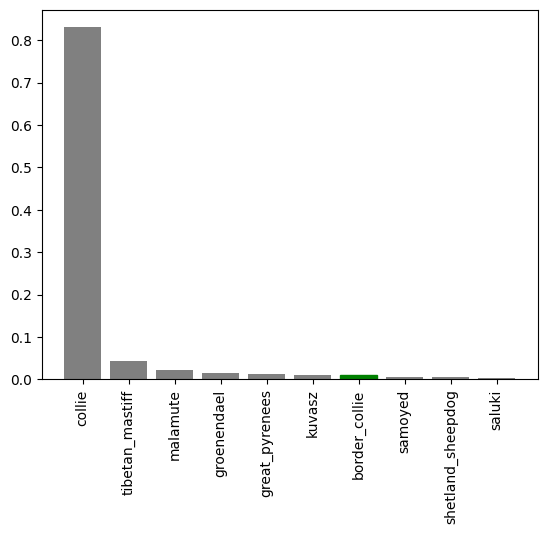

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evaluate our modle, let's check out a few.

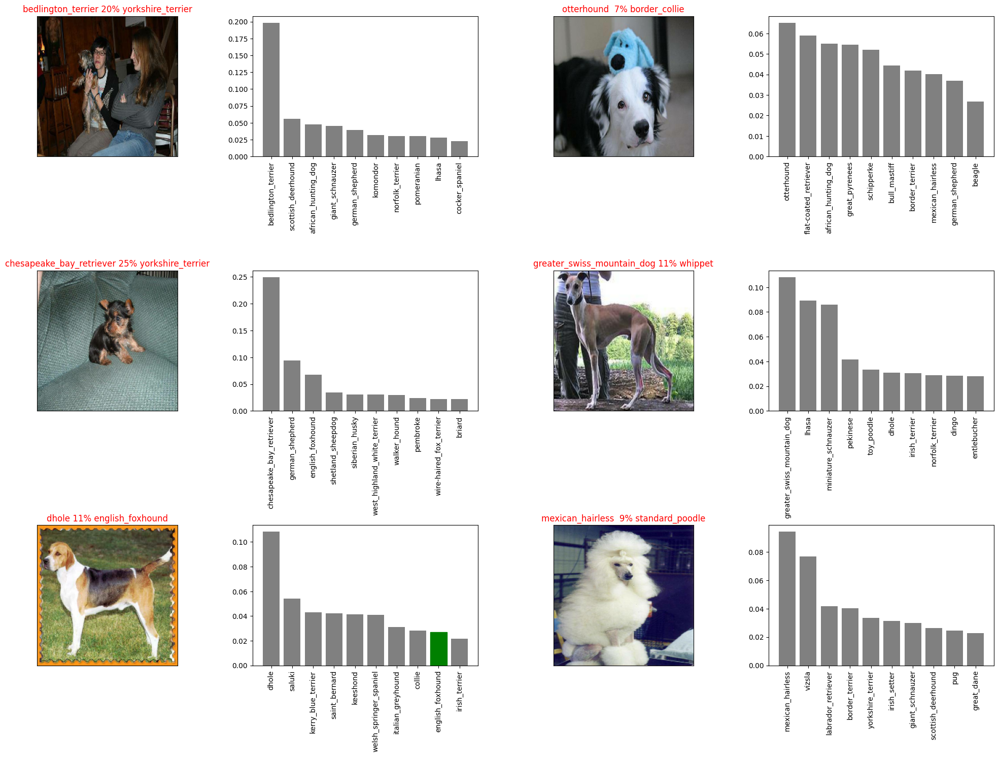

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

### Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/Dog-vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog-vision/models/20231121-15531700581980-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Dog-vision/models/20231121-15531700581980-1000-images-mobilenetv2-Adam.h5'

In [ ]:

loaded_1000_image_model = load_model('drive/My Drive/Dog-vision/models/20231121-12581700571536-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/My Drive/Dog-vision/models/20231121-12581700571536-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 84ms/step - loss: 5.6704 - accuracy: 0.0100


[5.670416831970215, 0.009999999776482582]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 80ms/step - loss: 1.2785 - accuracy: 0.6400


[1.2785300016403198, 0.6399999856948853]

### Training a big dog model 🐶 (on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
X[:10]

['/content/drive/MyDrive/Dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
X_train[:10]

['/content/drive/MyDrive/Dog-vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
 '/content/drive/MyDrive/Dog-vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
 '/content/drive/MyDrive/Dog-vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
 '/content/drive/MyDrive/Dog-vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
 '/content/drive/MyDrive/Dog-vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg',
 '/content/drive/MyDrive/Dog-vision/train/0ea5759640f2e1c2d1a06adaf8a54ca7.jpg',
 '/content/drive/MyDrive/Dog-vision/train/03e1d2ee5fd90aef036c90a9e7f81177.jpg',
 '/content/drive/MyDrive/Dog-vision/train/16941a6728ddb9cb7423a6cc97fbe071.jpg',
 '/content/drive/MyDrive/Dog-vision/train/0bedbecd92390ef9f4f7c8b06a629340.jpg',
 '/content/drive/MyDrive/Dog-vision/train/143b9484273e57668d03bfc26755810a.jpg']

In [ ]:
len(X_train)

800

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 3807s 12s/step - loss: 1.3413 - accuracy: 0.6686
Epoch 2/100
320/320 [==============================] - 32s 100ms/step - loss: 0.3968 - accuracy: 0.8786
Epoch 3/100
320/320 [==============================] - 32s 100ms/step - loss: 0.2382 - accuracy: 0.9324
Epoch 4/100
320/320 [==============================] - 32s 100ms/step - loss: 0.1533 - accuracy: 0.9642
Epoch 5/100
320/320 [==============================] - 32s 101ms/step - loss: 0.1036 - accuracy: 0.9791
Epoch 6/100
320/320 [==============================] - 32s 99ms/step - loss: 0.0775 - accuracy: 0.9874
Epoch 7/100
320/320 [==============================] - 32s 101ms/step - loss: 0.0589 - accuracy: 0.9904
Epoch 8/100
320/320 [==============================] - 32s 101ms/step - loss: 0.0457 - accuracy: 0.9942
Epoch 9/100
320/320 [==============================] - 32s 101ms/step - loss: 0.0379 - accuracy: 0.9965
Epoch 10/100
320/320 [==============================] - 32s 100ms

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog-vision/models/20231121-17071700586450-full-image-set-mobilenetv2-Adam.h5...


'drive/My Drive/Dog-vision/models/20231121-17071700586450-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model('drive/My Drive/Dog-vision/models/20231121-17071700586450-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/My Drive/Dog-vision/models/20231121-17071700586450-full-image-set-mobilenetv2-Adam.h5


### Making predictions on the test dataset

Given that our model has been trained on images in the form of Tensor batches, adapting the test data for predictions requires aligning it with the same format. Fortunately, we previously crafted the `create_data_batches()` function, designed to accept a list of filenames as input and convert them into Tensor batches. This function proves invaluable for preparing the test data to match the input format our model expects for making predictions.

To make predictions on the test data, we'll:

* Get the test image filenames.
* Convert the filenames into test data batches using `create_data_batches()` and setting the test_data parameter to `True` (since the `test data` doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames
test_path = "drive/My Drive/Dog-vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/Dog-vision/test/e721c3eec5951861bf3ed7f40ef8b091.jpg',
 'drive/My Drive/Dog-vision/test/de327414ced20d4e6f786a68bff82e10.jpg',
 'drive/My Drive/Dog-vision/test/e4d878f113883a3caab47d3126d2c2a4.jpg',
 'drive/My Drive/Dog-vision/test/e60df508ef9f70f9c556003827827234.jpg',
 'drive/My Drive/Dog-vision/test/df99a948e43d3399aff2e8ab2c18e184.jpg',
 'drive/My Drive/Dog-vision/test/e12731c30619c3fa4b0d9d9a76fb9d60.jpg',
 'drive/My Drive/Dog-vision/test/e1deaf47925c840d804d7ff0324ee1fe.jpg',
 'drive/My Drive/Dog-vision/test/e2a9a7580a1424bc6531b2b7375338db.jpg',
 'drive/My Drive/Dog-vision/test/e3d417026b89cbb57b00a7208421009d.jpg',
 'drive/My Drive/Dog-vision/test/e246de79e4efd1145698d9c21466bbaf.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about a ~1hr). This is because we have to process ~10,000+ images and get our model to find patterns in those images and generate predictions based on what its learned in the training dataset.

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

  3/324 [..............................] - ETA: 26:08

KeyboardInterrupt: ignored

In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/My Drive/Dog-vision/preds_array.csv",test_predictions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/My Drive/Dog-vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.83677038e-08, 5.17553053e-05, 2.69985024e-11, ...,
        5.33478886e-11, 6.75792533e-09, 3.44794998e-10],
       [1.58829891e-07, 2.31566477e-09, 4.56587390e-09, ...,
        2.57892816e-06, 5.16099390e-04, 1.41648968e-07],
       [7.98601879e-11, 3.74085402e-10, 4.18952828e-09, ...,
        8.05888192e-08, 1.89811078e-09, 1.46187844e-07],
       ...,
       [5.43561995e-08, 1.92931793e-07, 6.91135426e-07, ...,
        6.47928982e-06, 5.04803938e-06, 8.23406765e-07],
       [1.54678304e-07, 1.42071885e-05, 2.62299380e-07, ...,
        4.09388122e-07, 1.34973825e-05, 1.52552855e-06],
       [9.76226318e-08, 5.74986007e-05, 1.77218293e-08, ...,
        2.92361983e-06, 3.89835486e-06, 5.50353377e-07]])

In [ ]:
test_predictions.shape

(10357, 120)

### Preparing test dataset predictions for Kaggle
Kaggle wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilites) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
["id"] + list(unique_breeds)

['id',
 'affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenen

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
test_ids[:10],preds_df["id"][:10]

(['e721c3eec5951861bf3ed7f40ef8b091',
  'de327414ced20d4e6f786a68bff82e10',
  'e4d878f113883a3caab47d3126d2c2a4',
  'e60df508ef9f70f9c556003827827234',
  'df99a948e43d3399aff2e8ab2c18e184',
  'e12731c30619c3fa4b0d9d9a76fb9d60',
  'e1deaf47925c840d804d7ff0324ee1fe',
  'e2a9a7580a1424bc6531b2b7375338db',
  'e3d417026b89cbb57b00a7208421009d',
  'e246de79e4efd1145698d9c21466bbaf'],
 0    e721c3eec5951861bf3ed7f40ef8b091
 1    de327414ced20d4e6f786a68bff82e10
 2    e4d878f113883a3caab47d3126d2c2a4
 3    e60df508ef9f70f9c556003827827234
 4    df99a948e43d3399aff2e8ab2c18e184
 5    e12731c30619c3fa4b0d9d9a76fb9d60
 6    e1deaf47925c840d804d7ff0324ee1fe
 7    e2a9a7580a1424bc6531b2b7375338db
 8    e3d417026b89cbb57b00a7208421009d
 9    e246de79e4efd1145698d9c21466bbaf
 Name: id, dtype: object)

In [ ]:
os.path.splitext(test_filenames[0])

('drive/My Drive/Dog-vision/test/e721c3eec5951861bf3ed7f40ef8b091', '.jpg')

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e721c3eec5951861bf3ed7f40ef8b091,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,de327414ced20d4e6f786a68bff82e10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e4d878f113883a3caab47d3126d2c2a4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e60df508ef9f70f9c556003827827234,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,df99a948e43d3399aff2e8ab2c18e184,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e721c3eec5951861bf3ed7f40ef8b091,1.836770e-08,5.175531e-05,2.699850e-11,2.992445e-10,2.522760e-08,1.617716e-09,7.043877e-09,7.094819e-09,1.018063e-09,...,8.930703e-07,7.619048e-10,3.471537e-09,1.068710e-07,7.497512e-07,1.064902e-09,2.639993e-09,5.334789e-11,6.757925e-09,3.447950e-10
1,de327414ced20d4e6f786a68bff82e10,1.588299e-07,2.315665e-09,4.565874e-09,3.987254e-08,1.179987e-03,2.563002e-07,3.060388e-07,3.883435e-05,1.979383e-07,...,1.296890e-06,3.042446e-04,1.142344e-06,1.675659e-06,5.897364e-09,1.113247e-08,1.219633e-04,2.578928e-06,5.160994e-04,1.416490e-07
2,e4d878f113883a3caab47d3126d2c2a4,7.986019e-11,3.740854e-10,4.189528e-09,2.140877e-11,1.277872e-10,1.912799e-11,1.440413e-11,1.691120e-11,1.824213e-08,...,4.984493e-10,1.637292e-08,1.594863e-05,1.704029e-08,3.043825e-03,5.289866e-11,5.677999e-12,8.058882e-08,1.898111e-09,1.461878e-07
3,e60df508ef9f70f9c556003827827234,7.086690e-10,7.843345e-12,4.363272e-07,2.776367e-11,4.904179e-12,4.827042e-08,4.078163e-07,9.376354e-09,8.410714e-09,...,4.947021e-11,1.102779e-08,4.968928e-09,3.218647e-05,9.603249e-09,2.737434e-08,6.068899e-07,1.606263e-10,1.164993e-09,2.233686e-09
4,df99a948e43d3399aff2e8ab2c18e184,4.700518e-09,4.697607e-12,1.774864e-12,4.929055e-04,2.205157e-09,4.741602e-11,7.773679e-13,6.316332e-12,9.015007e-10,...,5.282748e-09,9.892021e-11,1.164738e-11,1.494483e-08,5.295595e-11,3.457834e-10,9.629116e-10,5.784461e-09,4.337051e-06,1.324619e-09


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv('/content/drive/MyDrive/Dog-vision/full_model_predictions_submission_1_mobilenetV2.csv',
                index=False)


### Making predictions on custom images
To make predictions on custom images, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Get custom image filepaths
custom_path = "/content/drive/MyDrive/Dog-vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['/content/drive/MyDrive/Dog-vision/my-dog-photos/images.jpeg',
 '/content/drive/MyDrive/Dog-vision/my-dog-photos/download.jpeg',
 '/content/drive/MyDrive/Dog-vision/my-dog-photos/images (1).jpeg',
 '/content/drive/MyDrive/Dog-vision/my-dog-photos/images (2).jpeg',
 '/content/drive/MyDrive/Dog-vision/my-dog-photos/images (3).jpeg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 536ms/step


In [ ]:

custom_preds.shape

(5, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['weimaraner',
 'yorkshire_terrier',
 'border_collie',
 'pomeranian',
 'pomeranian']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
custom_images

[array([[[0.65110296, 0.47487748, 0.31360295],
         [0.65453434, 0.48848042, 0.3072304 ],
         [0.6503677 , 0.51225495, 0.28112745],
         ...,
         [0.78174025, 0.65110296, 0.57659316],
         [0.7192402 , 0.59338236, 0.53308827],
         [0.7289216 , 0.6034314 , 0.5446079 ]],
 
        [[0.66519994, 0.47856954, 0.32076332],
         [0.6616947 , 0.49564078, 0.31439078],
         [0.65752804, 0.5194153 , 0.28828782],
         ...,
         [0.72143656, 0.5907993 , 0.5157301 ],
         [0.6973116 , 0.57469827, 0.50467056],
         [0.7352988 , 0.6133888 , 0.54382473]],
 
        [[0.653029  , 0.46205387, 0.30457836],
         [0.6459288 , 0.4758937 , 0.294958  ],
         [0.6453243 , 0.4971538 , 0.2693789 ],
         ...,
         [0.66592133, 0.53528404, 0.46016148],
         [0.6206255 , 0.49832156, 0.42128912],
         [0.63931036, 0.51774174, 0.44044834]],
 
        ...,
 
        [[0.89747036, 0.814584  , 0.8123515 ],
         [0.89789134, 0.8164216 , 0.81426

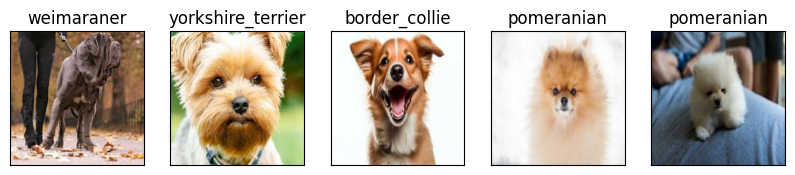

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)